<img src='Static_figs/LSASAF_NoName_Colour.png' align='right' width='25%'></img>

<div class="alert alert-block alert-success">
<b>PREREQUISITE </b><br>
    
For smooth experience some actions are needed:
* It is expected for user to be familiar with Python
* It is expected, that **MSG MDFAPAR** product data is downloaded from [LSA SAF data server](https://datalsasaf.lsasvcs.ipma.pt/PRODUCTS/MSG/MDFAPAR/NETCDF/) in `NetCDF4` format for the period from March 2023 to October 2023 and saved locally
* It is expected, that **MSG MDFVC** product data is downloaded from [LSA SAF data server](https://datalsasaf.lsasvcs.ipma.pt/PRODUCTS/MSG/MDFVC/NETCDF/) in `NetCDF4` format for the period from March 2023 to October 2023 and saved locally

</div>



<hr>

# Demonstration of Meteosat Second Generation Satellite Based LSA SAF Vegetation Products

#### About

The aim of this notebook is to present 3 of the several LSA SAF vegetation products. The full list of products is available on [LSA SAF webpage](https://landsaf.ipma.pt/en/data/products/vegetation/).

These products provide some information on the state of the vegetation and are therefore crucial for the investigation of effects of weather, weather extremes (for instance droughts) as well as pollution and other effects on vegetation.
- **Leaf Area Index (LAI)** is a parameter, that describes plant canopies. It is dimensionless (m²/ m²) and is defined as $\frac{1}{2}$ of the total leaf area in a vertical column, divided by the ground area in the same column. It is normalized to the value between 0 and 7.
  
- **Fraction of Absorbed Photosynthetic Active Radiation (FAPAR)** describes a fraction of photosynthetically active light, that is absorbed in plants. Photosynthetically active radiation is defined as a light with wavelength between 400 and 700 nm. Therefore FAPAR represents a direct measure of the photosynthetic activity and has a crucial role in investigating carbon-cycle and investigating the vegetation on a global scale.
  
-  **Fraction of Vegetation Cover (FVC)** is an index, that describes the amount of vegetation. It is defined as a fraction of the ground covered with vegetation. It is a very practical index for the estimation of the general quantity and state of the vegetation.
  
All these indices are available as LSA SAF products based on the Meteosat Second Generation (MSG) satellite on a daily basis. The aim of this notebook is to demonstrate how to open products in `NetCDF4` files and prepare simple representations, either as a plot or as an animation.

The 2 ways of accessing the data are represented here. Firstly, the use of locally saved data will be presented. The data can be loaded from [LSA SAF data server](https://datalsasaf.lsasvcs.ipma.pt/PRODUCTS/) using one of the approaches described [here](https://gitlab.com/helpdesk.landsaf/lsasaf_data_access/-/wikis/home).

Second, the use of the [THREDDS Data Server](https://gitlab.com/helpdesk.landsaf/lsasaf_data_access/-/wikis/data/thredds) will be shown. THREDDS uses OpeNDAP protocol, which allows accessing the saved data remotely as well as only downloading a subset of `NetCDF4` files. The advantage of this approach is no space on the hard drive is needed, but on the downside loading the data into RAM is extremely slow.

#### How to access the data

Data can be accessed from [LSA-SAF data server](https://datalsasaf.lsasvcs.ipma.pt/PRODUCTS/), prior registration is needed.

#### Basic facts on the LSA SAF MDFAPAR
> **Product number**: LSA-425
>
> **Spatial resolution**: 3km at nadir
> 
> **Spatial coverage**: MSG-Disk
> 
> **Time steps**: 15 min
> 
> **Data availability**: from 2016
> 

#### Basic facts on the LSA SAF MDLAI
> **Product number**: LSA-423
>
> **Spatial resolution**: 3km at nadir
> 
> **Spatial coverage**: MSG-Disk
> 
> **Time steps**: 15 min
> 
> **Data availability**: from 2016
> 

#### Basic facts on the LSA SAF MDFVC
> **Product number**: LSA-421
>
> **Spatial resolution**: 3km at nadir
> 
> **Spatial coverage**: MSG-Disk
> 
> **Time steps**: 1 day
> 
> **Data availability**: from 2016
>

#### Module outline:
* [1 - Demonstration of LSA SAF MDFAPAR](#First)
* [2 - Wildfire Power Calculation](#Second)
* [3 - Demonstration of LSA SAF MDFVC](#Third)

<hr>

#### Load required libraries

In [1]:
import numpy as np 
import pandas as pd
import datetime as dt
import xarray as xr

import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter
from matplotlib.animation import FuncAnimation

import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cf

from IPython.display import HTML
from matplotlib import rcParams

/home/primozic/anaconda3/envs/adam_env/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### <a id='First'></a>1. Demonstration of LSA SAF MDFAPAR

Here an example of a presentation of a pre-downloaded **LSA SAF MDFAPAR** product will be made. It is assumed, that the MDFAPAR `NetCDF4` file `NETCDF4_LSASAF_MSG_FAPAR_MSG-Disk_202304010000.nc` for March 1, 2023 is already downloaded and saved. We first set its location.

In [2]:
FAPAR_Location="Data_FAPAR/"

Then we can define the `xarray` dataset and look at the content of our `NetCDF4` file:

In [3]:
FAPAR_dataset=xr.open_dataset(FAPAR_Location+"NETCDF4_LSASAF_MSG_FAPAR_MSG-Disk_202304010000.nc")
print(FAPAR_dataset)

<xarray.Dataset>
Dimensions:         (time: 1, lat: 3201, lon: 3201)
Coordinates:
  * lat             (lat) float32 80.0 79.95 79.9 79.85 ... -79.9 -79.95 -80.0
  * lon             (lon) float32 -80.0 -79.95 -79.9 -79.85 ... 79.9 79.95 80.0
  * time            (time) datetime64[ns] 2023-04-01
Data variables:
    FAPAR           (time, lat, lon) float32 ...
    crs             |S1 ...
    quality_flag    (time, lat, lon) float32 ...
    standard_error  (time, lat, lon) float32 ...
Attributes: (12/27)
    date_created:               2023-04-02T00:20:58Z
    algorithm_version:          2.0.0
    base_algorithm_version:     3.0.1
    processing_level:           03
    platform:                   MSG3
    sensor:                     SEVI
    ...                         ...
    westernmost_longitude:      80.0
    spatial_resolution:          0.05x 0.05
    geospatial_lat_units:       degrees_north
    geospatial_lon_units:       degrees_east
    Conventions:                CF-1.6
    netcdf

MDFAPAR product is organized as a `NetCDF4` file with a 3D grid of data (latitude, longitude, time), although the time dimension only has 1 point. Additionally, we can check all the Attributes imprinted in the `NetCDF4` file. The simplest option to plot MDFAPAR is to use `xarray.DataSet.plot()`, which is quick and easy, but it does not allow customization.

As mentioned, the MDFAPAR values will be saved into the memory only at this point. Furthermore `DataSet.sel()` will be used to load only a latitude-longitude square of interest.

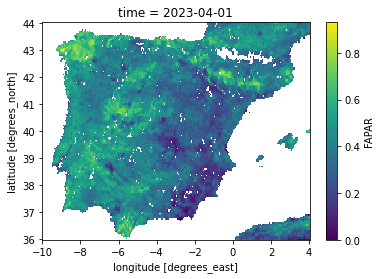

In [4]:
# Chose only locations of the interest
FAPAR_dataset=FAPAR_dataset.sel(lat=slice(44, 36), lon=slice(-10, 4))

# Chose DataArray "FAPAR" from DataSet and plot it
FAPAR_dataset.FAPAR.plot()

This allows for an easy representation but lacks any option to visually customize the plot. This needs to be done manually. One way to do so is, to use `xarray.DataArray.values` which returns a numpy array with values, which can be then plotted with `pyplot`.

Before plotting we can first define some functions used for the customization of plots:

In [5]:
# Define a custom tick formatter function for latitude
def custom_latitude_formatter(x, pos):
    if x >= 0:
        return f"{x}˚ N"
    else:
        return f"{abs(x)}˚ S"

# Define a custom tick formatter function for longitude
def custom_longitude_formatter(y, pos):
    if y >= 0:
        return f"{y}˚ E"
    else:
        return f"{abs(y)}˚ W"

Since we will plot more similar plots, we will simplify our work by defining the function `prepare_plot()` that will set up properties of our plot, without actual plotting (for instance setting up labels, grid, etc.). The function takes the title of the plot as an argument.

In [6]:
def prepare_plot(grid_step=10, title=None):
    '''
    Function, that defines figure and axes object and returns them
    It also sets grid, ticks, title and adds ocean, coastlines and borders.
    grid_step=[float] defines distance between grid lines in degrees
    title= [string] defines title of the plot
    '''
    #Define fontsize
    fontsize=14

    nan_color="slategray"

    # Get a handle on the figure and the axes
    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()},
                            figsize=(12, 7),
                            facecolor='white')
    
    #Defines position of gridlines
    grid_xrange=range(-180,180,grid_step)
    grid_yrange=range(-90,90,grid_step)

    # Gridlines are set
    grid_lines=ax.gridlines()
    grid_lines.xlocator=plt.FixedLocator(grid_xrange)
    grid_lines.ylocator=plt.FixedLocator(grid_yrange)

    # Ticks are set
    ax.set_xticks(grid_xrange, crs=ccrs.PlateCarree())
    ax.set_yticks(grid_yrange, crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(FuncFormatter(custom_longitude_formatter))
    ax.yaxis.set_major_formatter(FuncFormatter(custom_latitude_formatter))
    ax.tick_params(axis="both", labelsize=fontsize)

    # Ocean is defined and added
    ocean50 = cartopy.feature.NaturalEarthFeature('physical', 'ocean',
                                                   scale='50m', edgecolor='none', facecolor='lightblue')
    ax.add_feature(ocean50)

    # Coastlines and borders are added
    ax.coastlines()
    ax.add_feature(cf.BORDERS)

    # Set face color
    ax.set_facecolor(nan_color)

    # Axis labels are added
    ax.set_xlabel('Longitude',fontsize=fontsize)
    ax.set_ylabel('Latitude',fontsize=fontsize)
    ax.set_title(title,fontsize=fontsize)

    return fig, ax

In the next step, we extract a 2D `numpy array` of FAPAR values from the dataset and 2 1D arrays with latitude and longitude coordinates.

In [7]:
# Extract FAPAR lat/lon and LAI values
FAPAR_latitudes=FAPAR_dataset.lat.values
FAPAR_longitudes=FAPAR_dataset.lon.values
FAPAR_values=FAPAR_dataset.FAPAR.values[0,:,:]

In the next step, we make our plot. The `pyplot.contour()`function is used, which produces a contour plot of a 2D array. In comparison `pyplot.pcolormeash()`, which plots the values of each pixel, will be used in the next example. The contour plot offers a softened and visually more appealing result but loses some data.

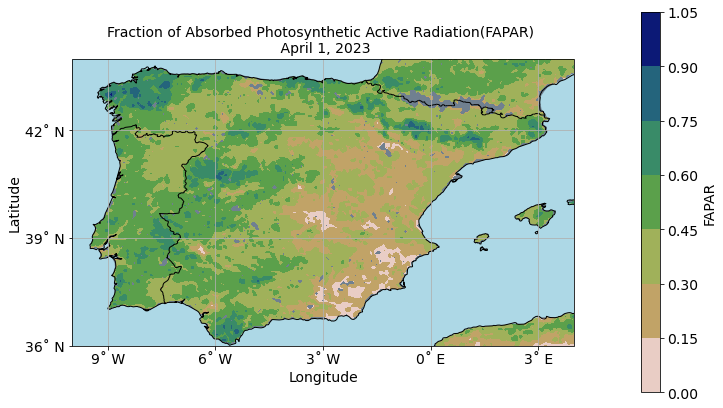

In [8]:
# Set colormap and fontsize
colormap="gist_earth_r"
fontsize=14

# Set fig
fig, ax=prepare_plot(grid_step=3, title="Fraction of Absorbed Photosynthetic Active Radiation(FAPAR) \n April 1, 2023")

# Plot the data
im=ax.contourf(FAPAR_longitudes, FAPAR_latitudes,FAPAR_values, cmap=colormap)

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.1)
cbar.set_label(label="FAPAR", size=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

ax.set_extent([-10,4,36,44], crs=ccrs.PlateCarree())

### <a id='Second'></a>2. Demonstration of LSA SAF MDLAI

In this section, an example of LSA SAF MDLAI product daily values will be made. MDLAI estimations for April 1, 2023, will be shown. MDLAI product is organized in `NetCDF` files and has the same file structure as MDFAPAR.

This time we will access the data on the [LSA SAF THREEDS server](https://thredds.lsasvcs.ipma.pt/) server via [OpenDAP protocol](https://gitlab.com/helpdesk.landsaflsasaf_data_access/-/wikis/data/thredds) instead of using locally saved data. OpenDAP protocol is currently in the demonstrational phase.
It allows access of the whole `NetCDF4` file as well as also a subset of `NetCDF4` file, for instance only a 2D (lat-lon) slice or a list of points.

In order to access the data, one needs to [register](https://gitlab.com/helpdesk.landsaf/lsasaf_data_access/-/wikis/credentials/register). The examples on how to access the THREEDS server are available [here](https://gitlab.com/helpdesk.landsaf/lsasaf_data_access/-/wikis/data/thredds), while the documentation is available [here](https://www.unidata.ucar.edu/software/tds/). A catalog of available data is accessible with a prior registration [here](https://thredds.lsasvcs.ipma.pt/thredds/catalog/catalog.html).

In general, one can use `xarray.open_dataset()` to access the THREDDS data. The location of the dataset needs to be specified as follows: `https://<USERNAME>:<PASSWORD>@thredds.lsasvcs.ipma.pt/thredds/dodsC/<satellite>/<product>/<format>/<year>/<month>/<day>/filename`.

An example of accessing the MDLAI product from April 1, 2023, will be made. We start by inputting our username and password:

In [9]:
USER="***"
PASSWD="***"

Then we define our `xarray.DataSet`. The `xarray` library uses "lazy loading", therefore the data will be loaded only when we will use `DataSet.load()` or call the data in the dataset.

In [10]:
LAI_dataset=xr.open_dataset("https://"
            +USER
            +":"
            +PASSWD
            +"@thredds.lsasvcs.ipma.pt/thredds/dodsC/MSG/MDLAI/NETCDF/2023/04/01/NETCDF4_LSASAF_MSG_LAI_MSG-Disk_202304010000.nc")
print(LAI_dataset)

<xarray.Dataset>
Dimensions:         (lat: 3201, lon: 3201, time: 1)
Coordinates:
  * lat             (lat) float32 80.0 79.95 79.9 79.85 ... -79.9 -79.95 -80.0
  * lon             (lon) float32 -80.0 -79.95 -79.9 -79.85 ... 79.9 79.95 80.0
  * time            (time) datetime64[ns] 2023-04-01
Data variables:
    crs             |S64 ...
    LAI             (time, lat, lon) float32 ...
    quality_flag    (time, lat, lon) float32 ...
    standard_error  (time, lat, lon) float32 ...
Attributes: (12/29)
    references:                      Data provided by the EUMETSAT Satellite ...
    easternmost_longitude:           -80.0
    westernmost_longitude:           80.0
    spatial_resolution:               0.05x 0.05
    geospatial_lat_units:            degrees_north
    geospatial_lon_units:            degrees_east
    ...                              ...
    geospatial_lat_resolution:        0.05
    geospatial_lon_resolution:        0.05
    northernmost_latitude:           80.0
    south

From this point forward, we will do everything in the same manner as in the previous example. Bear in mind, that the data stored in the `NetCDF4 file` will be loaded only in the next step:

In [11]:
# Chose only locations of the interest
LAI_dataset=LAI_dataset.sel(lat=slice(40, -40), lon=slice(-20, 60))

# Extract LAI lat/lon and LAI values
LAI_latitudes=LAI_dataset.lat.values
LAI_longitudes=LAI_dataset.lon.values
LAI_values=LAI_dataset.LAI.values[0,:,:]

In this step, we make our plot. We can use the function `prepare_plot()` defined in the previous section, with the exception, that we pass a different title and grid step size since the plot will be a little bit bigger, therefore greater steps between gridlines are required.

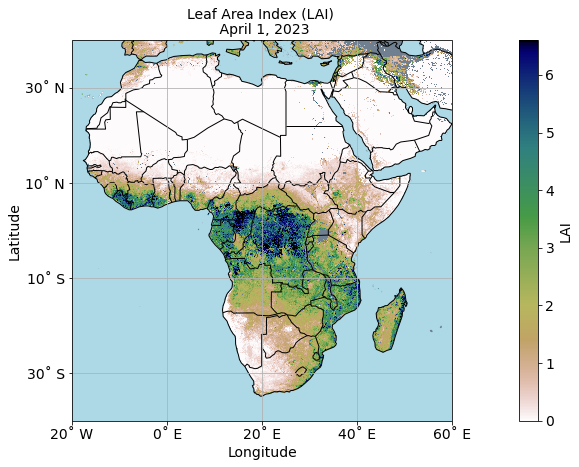

In [12]:
# Set colormap and fontsize
colormap="gist_earth_r"
fontsize=14

# Set fig
fig, ax=prepare_plot(grid_step=20, title="Leaf Area Index (LAI) \n April 1, 2023")

# Plot the data
im=ax.pcolormesh(LAI_longitudes, LAI_latitudes,LAI_values, cmap=colormap)

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.1)
cbar.set_label(label="LAI", size=fontsize)
cbar.ax.tick_params(labelsize=fontsize)
ax.set_extent([-20,60,-40,40], crs=ccrs.PlateCarree())

### <a id='Third'></a>3. Demonstration of LSA SAF MDFVC

In this section, the presentation of the LSA SAF MDFVC product for the spring, summer and the beginning of autumn 2023 in Europe will be made. The product will be presented as an animation produced with `matplotlib.Funcanimation`.

The LSA SAF MDFVC are also available as `NetCDF4` files with exactly the same internal structure as MDFAPAR and MDFVC products, described above.

It is assumed, that the MDFVC product `NetCDF4` files are already saved locally. We first set their location:

In [13]:
FVC_LOCATION="Data_FVC/"

We first need to define a list of `datetime` objects, for which we want to plot FVC.  We decided to plot it for the year 2023, for the dates between March and October. To limit the number of frames in the animation only every 10-th date is used.

In [14]:
# Start and end date are set
start_date=dt.datetime(2023, 3, 1, 0, 0, 0)
end_date=dt.datetime(2023, 10, 31, 0, 0, 0)

# A list of days of interest is generated
date_range=pd.date_range(start_date,end_date-dt.timedelta(days=1),freq='10d')

# Area of interest is defined 
LAT_SLICE=slice(55.0, 34.0)
LON_SLICE=slice(-10, 20)

# We can check the list of dates of the interest
print(date_range)

DatetimeIndex(['2023-03-01', '2023-03-11', '2023-03-21', '2023-03-31',
               '2023-04-10', '2023-04-20', '2023-04-30', '2023-05-10',
               '2023-05-20', '2023-05-30', '2023-06-09', '2023-06-19',
               '2023-06-29', '2023-07-09', '2023-07-19', '2023-07-29',
               '2023-08-08', '2023-08-18', '2023-08-28', '2023-09-07',
               '2023-09-17', '2023-09-27', '2023-10-07', '2023-10-17',
               '2023-10-27'],
              dtype='datetime64[ns]', freq='10D')


In the next cell, we define the update function, which takes a `datetime` object as an input, then accesses the locally saved `NetCDF4` file and returns a `DataSet` with only FVC values.

In [15]:
def update_data(date):
    '''
    Function returns FAI dataset. The area is defined in a global variable.
    '''
    # The next dataset is defined, but not loaded
    next_ds=xr.open_dataset("Data_FVC/NETCDF4_LSASAF_MSG_FVC_MSG-Disk_"
                                +str("{:02d}".format(date.year))
                                +str("{:02d}".format(date.month))
                                +str("{:02d}".format(date.day))
                                +"00"
                                +"00"
                                +".nc")
    
    # The next datased is loaded
    next_ds=next_ds.sel(lat=LAT_SLICE, lon=LON_SLICE)['FVC'].load()
    next_np=next_ds.values[0,:,:]


    time_coords = next_ds['time'].values
    lat_coords = next_ds['lat'].values
    lon_coords = next_ds['lon'].values   
    
    # Current dataset is closed, to fee the memorry, maximum is saved in numpy array
    next_ds.close()


    #LAI dataset is produced
    fvc_ds=xr.Dataset(
        data_vars={"FVC" : (["time", "lat","lon"], next_np[np.newaxis,:,:])},
        coords={
            "time" : time_coords,
            "lat": (["lat"], lat_coords, {"units": "degrees_north"}),
            "lon" : (["lon"], lon_coords, {"units": "degrees_east"})
            },
    )


    # The dataset is retunred as an function output
    return fvc_ds.FVC

In the next step, we first define the `figure` and set up the plot using the `prepare_plot()` function, defined before.

The animation is made using `FunctionAnimation`which essentially only updates the data (values) on the plot, but leaves other elements of the plot unchanged. Therefore, we also first need to plot the first frame.

The `%%capture` magic command in `jupyter` is used to avoid showing the half-made plot in the first cell, since the whole animation will be finished in the second cell.

In [16]:
%%capture

# There is deafult limit on animation size (21 MB). It needs to be adjusted
rcParams['animation.embed_limit'] = 100.0 


# Desired projection is choosen
choosen_projection=ccrs.PlateCarree()

# Fontsize and colormap are defined
fontsize = 14
colormap="gist_earth_r"

# Figure is defined
fig, ax= prepare_plot()

# Data for the first frame are plotted
first_frame_dataset=update_data(date_range[0])
first_frame_values=first_frame_dataset.values[0,:,:]#.flatten()
first_frame_lon=first_frame_dataset.lon.values
first_frame_lat=first_frame_dataset.lat.values

# The first frame is plotted
cax=ax.pcolormesh(first_frame_lon, first_frame_lat, first_frame_values, cmap=colormap)

# Colorbar is added
cbar = plt.colorbar(cax, ax=ax, orientation='vertical', pad=0.1)
cbar.set_label(label="FVC", size=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

# Title is added
plt.suptitle("Fractional vegetation cover (FVC)",
             fontsize=fontsize)

In the last step, we create animation. We define a function `animate()`, which adapts the presented plot by virtue of `.set_array()`. It also changes the title and sets the extent of the plot, since this action can't be done before plotting.

Animation is presented in jupyter notebook using `HTML(ani.to_jshtml())`. It can be also saved if desired using `ani.save()`.

In [17]:
# Function that updates the colormesh values is defined
def animate(frame):
    cax.set_array(update_data(date_range[frame]).values[0,:,:].flatten())
    ax.set_title("Date: " + date_range[frame].strftime('%d.%m.%Y'), fontsize=fontsize)
    ax.set_extent([-10,20,35, 55], crs=ccrs.PlateCarree())

# Animation is made
ani = FuncAnimation(
    fig,             # figure
    animate,         # Name of the update function
    frames=len(date_range),       # Number of frames
    interval=200     # ms between frames
)

# Close the last frame in the animation
plt.close(fig)

# Animation can be saved using following 
#ani.save("FVC_Europe.gif")

# Animation is shown within the jupyter notebook
HTML(ani.to_jshtml())

#### References:

* array Developers (2023). xarray User Guide. [https://docs.xarray.dev/en/stable/user-guide/index.html](https://docs.xarray.dev/en/stable/user-guide/index.html). Accesed: 20.2.2023
